In [1]:
#%%
import numpy as np
import netCDF4 as nc
import os
import re
import pandas as pd
import glob
import rasterio
from datetime import datetime, timedelta
import pandas as pd
import math
import calendar
import copy

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap,BoundaryNorm
import matplotlib.cm as cm
from matplotlib import colors
import matplotlib.colors as mcolors
from matplotlib.collections import LineCollection
from matplotlib.lines import Line2D
# import imageio
# import pygeodesy
# from pygeodesy.ellipsoidalKarney import LatLon
import folium
# from shapely.geometry import Point,Polygon
# from folium.plugins import FastMarkerCluster
from matplotlib.patches import Patch

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.ticker as mticker
from cartopy.io import shapereader
from sklearn.metrics import mean_squared_error
from scipy.stats import pearsonr
from scipy.signal import correlate
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle

import sys
params_path = '/data50/yingying/HydroDA/src'
#external python codes
sys.path.append(params_path)
sys.path.append('/data50/yingying/HydroDA/src/plot/jupyter/code')


In [72]:
import importlib
import params_case21 as pm    # out_msm_round*  # params_all_case3
pm_path = pm.__file__
pm_name = pm.__name__

import basic_command as basic
importlib.reload(basic)
from basic_command import find_id, read_bin2d, read_bin3d, read_bin_int, read_bin_station, read_nc, read_prep, read_plot_tif, low_resolution, save_select_points,cal_rmse,cal_kge,cal_nse,cal_single_metric,cal_peak_matric,evaluate_timeerror,evaluate_hour,evaluate_tot_hour,read_bin_mean,read_bin_assim

import make_plot as mpt
importlib.reload(mpt)

import make_obs
importlib.reload(make_obs)
from make_obs import read_obs,read_stations

import read_files
importlib.reload(read_files)
from read_files import all_select_plot, def_oscillating, def_flood_time, cal_all_HQ, obs_select,performance

import plot_DA
importlib.reload(plot_DA)
from plot_DA import cal_assimilate_grid, draw_weight,plot_obs_relationship,draw_single_station



In [66]:
# change the imported params in each *.py file
def change_pm(file):
    path_code = '/data50/yingying/HydroDA/src/plot/jupyter/code/'
    with open(path_code+file, 'r') as f:
        lines = f.readlines()
    lines[4] = f'import {pm_name} as pm\n'
    with open(path_code+file, 'w') as f:
        f.writelines(lines) 
change_pm('basic_command.py')
change_pm('read_files.py')
change_pm('plot_DA.py')
change_pm('make_obs.py')
change_pm('make_plot.py')
change_pm('compare_olvsDA.py')

In [67]:
camadir  = pm.CaMa_dir()
inputdir = pm.plot_dir()
expname  = pm.runname(pm.mode())
dahour   = pm.dahour()
dahour_str = '{:02d}'.format(dahour)
exp_plotdir = inputdir + '/exp_' + expname + dahour_str + '/'
print(exp_plotdir)
obsdir = pm.obs_dir(pm.real_mode())
fldreg = pm.flood_reg()
fld_latmin, fld_latmax, fld_lonmin, fld_lonmax = fldreg[0], fldreg[1], fldreg[2], fldreg[3]

# simulation start from 20191007 but analysis start from 20191010
# simulation start from 20240720 but analysis start from 20240723
# simulation start from 20240815 but analysis start from 20240818
start_year,start_month,start_date,start_hour=pm.starttime() # Start year month date
syyyy='%04d' % (start_year)
smm  ='%02d' % (start_month)
if (syyyy == '2019'):
    tstart = int(24*3)
    tstart_da = int(24*3/dahour)
if (syyyy == '2022'): # forecast start from 8.3-8.4, analyze start from 8.1-8.6
    tstart = 24
    tstart_da = int(24*2/dahour)
    tstart_fore = 48
else:
    tstart = 0
    tstart_da = 0
    tstart_fore = 0
smm='%02d' % (start_month)
sdd='%02d' % (start_date)
shh='%02d' % (start_hour)
stime = datetime(start_year,start_month,start_date,start_hour)
end_year,end_month,end_date,end_hour=pm.endtime() # Start year month date
eyyyy='%04d' % (end_year)
emm='%02d' % (end_month)
edd='%02d' % (end_date)
ehh='%02d' % (end_hour)
etime = datetime(end_year,end_month,end_date,end_hour)
time_step = timedelta(hours=dahour)
time_len = int((etime-stime).total_seconds() / 3600)
time_len_assim = 144
time_len_da = int((etime-stime).total_seconds() / 3600 / dahour) 

path_alloc   = pm.alloc_dir()
name_alloc   = '/wlv_2019h.xlsx'
df     = pd.read_excel(path_alloc+name_alloc)
df.rename(columns={df.columns[1]: 'latitude', df.columns[2]: 'longitude'}, inplace=True)
id_info =  np.array(df.iloc[:,0])
lat_obs =  np.array(df.iloc[:,1])
lon_obs =  np.array(df.iloc[:,2])
ix     = np.array(df.iloc[:,8])-1  # lon_ind
iy     = np.array(df.iloc[:,9])-1  # lat_ind


/data42/yingying/HydroDA/plot/exp_ils01/


In [68]:
# simulation start from 20191007 but analysis start from 20191010
# simulation start from 20240720 but analysis start from 20240723
# simulation start from 20240815 but analysis start from 20240818
if 'case' in pm_name:
    lon,lat,rainf = read_prep('/data42/yingying/data/matsiro_frc/tej_rain'+smm+'.nc')
    if smm == '07':
        rainf = rainf[19*24:int(19*24+time_len),:,:]
    else:
        rainf = rainf[14*24:int(14*24+time_len),:,:]
else:
    lat,lon,rainf = read_prep('/data42/yingying/data/matsiro_frc/tej_amedas2019.nc')
    rainf = rainf[6*24:int(6*24+time_len),:,:]


['time', 'lat', 'lon', 'Precip']


In [6]:
lat_min1,lat_max1,lon_min1,lon_max1 = 30,46,128,149
up_plot = read_plot_tif('upa',lat_min1,lat_max1,lon_min1,lon_max1)

#%% lower resolution
size1=120
uparea_filter = np.where(up_plot<10**2,np.nan,up_plot)
up_low = low_resolution(uparea_filter,size1,lat_min1,lat_max1,lon_min1,lon_max1) # for figure ploting
lon_map_low = np.linspace(lon_min1,lon_max1,int((lon_max1-lon_min1)*3600/size1))
lat_map_low = np.linspace(lat_min1,lat_max1,int((lat_max1-lat_min1)*3600/size1))
lon2d_low_map, lat2d_low_map = np.meshgrid(lon_map_low, lat_map_low)

# #%% read small tiff data
lat_min2,lat_max2,lon_min2,lon_max2 = 34,37,137,141
up_area = read_plot_tif('upa',lat_min2,lat_max2,lon_min2,lon_max2)
#%% lower resolution
size2=10   
uparea_low = low_resolution(up_area,size2,lat_min1,lat_max1,lon_min1,lon_max1)
uparea_low = np.where(uparea_low<10,np.nan,uparea_low)
lon_tiff = np.linspace(lon_min2,lon_max2,int((lon_max2-lon_min2)*3600/size2))
lat_tiff = np.linspace(lat_min2,lat_max2,int((lat_max2-lat_min2)*3600/size2))


/data50/yingying/HydroDA/src/plot/jupyter/code/basic_command.py:281: RuntimeWarning: Mean of empty slice
  var_low[row,col] = np.nanmean(var[row*size:(row+1)*size,col*size:(col+1)*size])


In [69]:
#%% show the validation stations
# obs_situ_dir = pm.alloc_dir() + '/'
# 30 validation stations
obs_situ_dir = '/data42/yingying/HydroDA/Empirical_LocalPatch/MLIT/alloc/'
if 'case' in pm_name:
    file_select_lon = 'lon_select_index0.txt'
    file_select_lat = 'lat_select_index0.txt' 
    if pm.val_mode()==5:
        file_valid_lon = 'lon_exclude_index'+str(pm.val_round(pm.val_mode()))+'.txt'
        file_valid_lat = 'lat_exclude_index'+str(pm.val_round(pm.val_mode()))+'.txt'
    else:
        file_valid_lon = 'lon_exclude_index0.txt'
        file_valid_lat = 'lat_exclude_index0.txt'       
else:
    if pm.val_mode()==5:
        file_valid_lon = 'lon_exclude_index'+str(pm.val_round(pm.val_mode()))+'.txt'
        file_valid_lat = 'lat_exclude_index'+str(pm.val_round(pm.val_mode()))+'.txt'
    else:
        file_select_lon = 'lon_select_index0.txt'
        file_select_lat = 'lat_select_index0.txt'
        file_valid_lon = 'lon_exclude_index0.txt'
        file_valid_lat = 'lat_exclude_index0.txt'

lony_select = np.array(np.loadtxt(obs_situ_dir+file_select_lon),dtype=int)
latx_select = np.array(np.loadtxt(obs_situ_dir+file_select_lat),dtype=int)
lony_valid = np.array(np.loadtxt(obs_situ_dir+file_valid_lon),dtype=int)
latx_valid = np.array(np.loadtxt(obs_situ_dir+file_valid_lat),dtype=int)
print(obs_situ_dir+file_valid_lat)
lat_select  = lat[latx_select-1]
lon_select  = lon[lony_select-1]
lat_valid  = lat[latx_valid-1]
lon_valid  = lon[lony_valid-1]

# numbers of assimilated pixels
if pm.val_mode()==0:
    # all stations for DA
    num_assim_path = pm.patch_filedir()+'/obs_patch/countnum.bin'
elif pm.val_mode()==5:
    # random selection for validation
    num_assim_path = pm.patch_filedir()+'/obs_select_patch'+str(pm.val_round(pm.val_mode()))+'/countnum.bin'
else:
    # validation
    num_assim_path = pm.patch_filedir()+'/obs_select_patch0/countnum.bin'
assim_path_ori = pm.patch_filedir()+'/obs_select_patch0/countnum.bin'
    
assim_pixel     = read_bin_int(num_assim_path,2) 
assim_pixel_ori = read_bin_int(assim_path_ori,2) 
assim_plot_num  = assim_pixel[0,:,:]
assim_pixel_num = assim_pixel_ori[0,:,:]

assim_num = np.zeros(np.shape(lony_valid)[0])
assim_select = np.zeros(np.shape(lony_select)[0])
for i in range(0,np.shape(lony_valid)[0]):
    assim_num[i] = assim_plot_num[int(latx_valid[i]-1),int(lony_valid[i]-1)]
for i in range(0,np.shape(lony_select)[0]):
    assim_select[i] = assim_pixel_num[int(latx_select[i]-1),int(lony_select[i]-1)]

lat_select_file = np.delete(latx_valid,assim_num==0)
lon_select_file = np.delete(lony_valid,assim_num==0)
assim_num_plot = np.delete(assim_num,assim_num==0)

coords = np.stack((lat_select_file,lon_select_file),axis=1)
_,unique_indices = np.unique(coords,axis=0,return_index = True)  # delete repeated elements
unique_ind_sorted = np.sort(unique_indices)
lat_unique = lat_select_file[unique_ind_sorted]
lon_unique = lon_select_file[unique_ind_sorted]
assim_unique = assim_num_plot[unique_ind_sorted]
sorted_indices = np.lexsort((lon_unique, lat_unique))
lat_valid_plot = lat_unique[sorted_indices]
lon_valid_plot = lon_unique[sorted_indices]
assim_num_plot = assim_unique[sorted_indices]

/data42/yingying/HydroDA/Empirical_LocalPatch/MLIT/alloc/lat_exclude_index6.txt


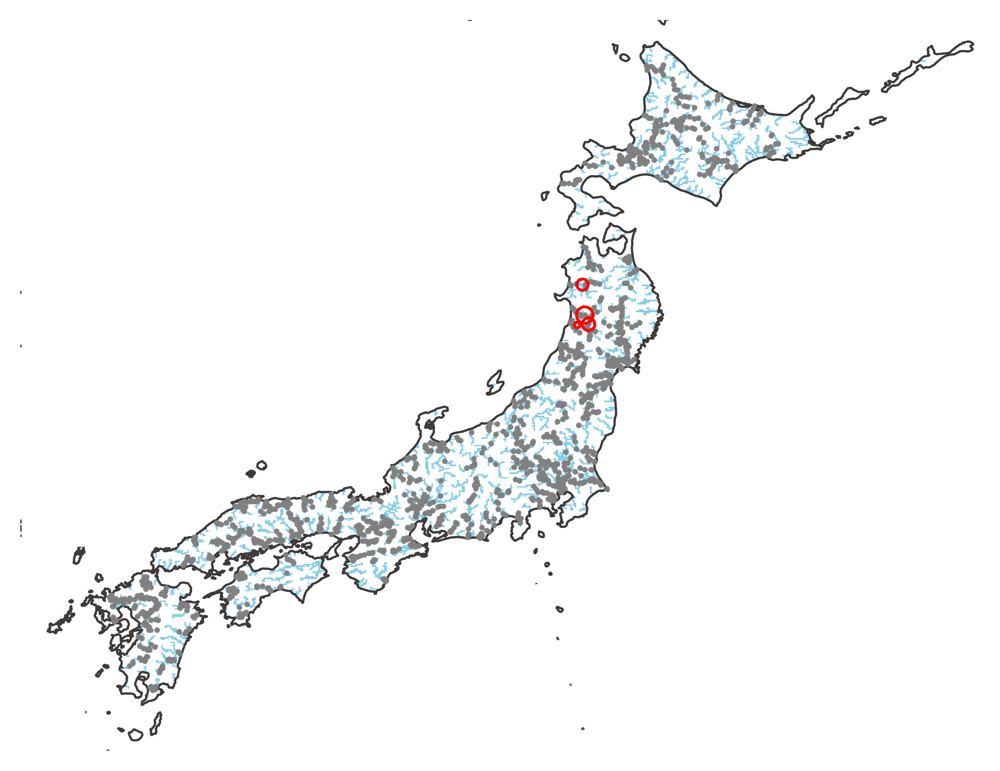

In [70]:
#%% draw the select stations
save_select_points(pm_name,lat_valid_plot,lon_valid_plot,assim_num_plot)
mpt.draw_select_station(lon_valid,lat_valid,assim_num,lon_select,lat_select,lon2d_low_map,lat2d_low_map,up_low,inputdir,pm_path,'/1.stations')

In [73]:
# read DA output 
# (if code has error in this block, please import package again)
new_row = ['da'+dahour_str]
elvmean  = read_bin2d(obsdir+'/elv_mean'+syyyy+'.bin')

# move the files from pm.outdir() to ./yyyy/pm.outdir()
if ((pm.val_mode())==0) & ('case' not in pm_path):
    outdir = pm.DA_dir()+'/'+str(syyyy)+'/out_all'
elif 'case' in pm_path:
    outdir = pm.DA_dir()+'/out_all'
elif (pm.val_mode())==5:
    outdir = pm.DA_dir()+'/out_msm_round'+str(pm.val_round(pm.val_mode()))
elif 'ens' in pm_path:
    outdir = pm.DA_dir()+'/out_ens_round'+str(pm.val_round(pm.val_mode()))
else:
    outdir = pm.DA_dir()+'/'+str(syyyy)+'/out_ils_round'+str(pm.val_round(pm.val_mode()))
fmean = outdir + '/simmean/'+expname+'/C000.bin'
simmean  = read_bin2d(fmean)

# ------------------------------ can be delete later ----------
data_obs_wlv = read_obs('wlv',stime,etime,time_len,obsdir)
data_obs_wlv = data_obs_wlv - elvmean
# ------------------------------ can be delete later ----------


data_obs_wlv,da_station,sim_station,obs_station,mean_station,prep_station = read_stations('rivdph',pm_path,stime,etime,time_len,obsdir,elvmean,inputdir,expname,dahour_str,lat_valid_plot,lon_valid_plot,rainf,simmean)
# if syyyy == '2019':
#     data_obs_dis,da_station_dis,sim_station_dis,obs_station_dis,mean_station_dis,prep_station_dis = read_stations('outflw')
print(np.shape(data_obs_wlv))

(24, 1320, 1500)


In [74]:
# read cases simulation results
lat_all_flood, lon_all_flood, assim_all_flood, obs_station_all, da_station_all, sim_station_all = all_select_plot(pm_name)


In [75]:
#%% define the starting time and ending time for a flood event
# define threshold based on 95% distribution of annual hourly 
flood_time_valid  = def_flood_time(int(syyyy),ix,iy,id_info,lon_valid_plot-1,lat_valid_plot-1,time_len,data_obs_wlv,elvmean,tstart)
flood_time_select = def_flood_time(int(syyyy),ix,iy,id_info,lony_select-1,latx_select-1,time_len,data_obs_wlv,elvmean,tstart)


/data50/yingying/HydroDA/src/plot/jupyter/code/read_files.py:49: RuntimeWarning: Mean of empty slice
  obs_mean = np.nanmean(obs_wlv)


/data49/yingying/miniconda/miniconda3/envs/data/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:552: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/data49/yingying/miniconda/miniconda3/envs/data/lib/python3.13/site-packages/numpy/_core/_methods.py:137: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/data49/yingying/miniconda/miniconda3/envs/data/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:3037: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/data49/yingying/miniconda/miniconda3/envs/data/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:2894: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/data49/yingying/miniconda/miniconda3/envs/data/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:2894: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/data49/yingying/miniconda

17.0 17
How many stations improve:  100.00 %


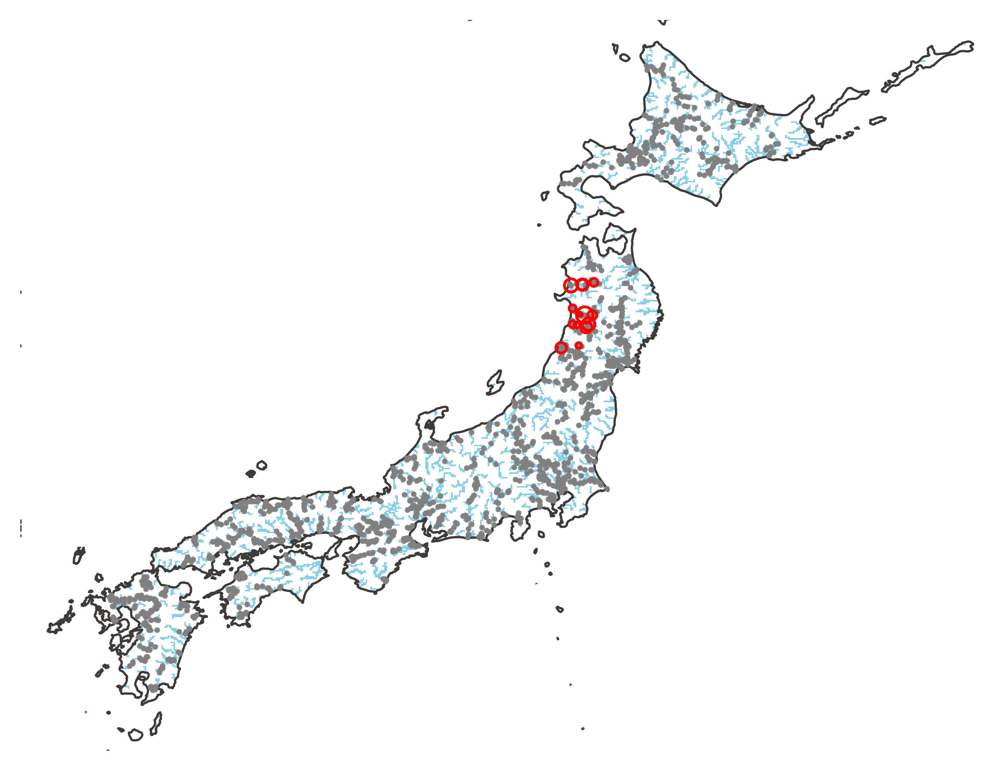

In [76]:
# standard simulation is ens20 [-1]
# plot station wlv validation
alabel = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)']
lon_point, lat_point, lon_point_ind, lat_point_ind, obs_point_ind, sim_point_ind, da_point_ind, num_point, new_row = mpt.draw_lines('Anomaly WSE (m)',lat_all_flood, lon_all_flood, assim_all_flood, obs_station_all, da_station_all, sim_station_all,'_wlv',new_row,alabel,syyyy,tstart,time_len,simmean,pm_name,rainf,lon,lat,pm_path,expname,dahour_str,exp_plotdir)
        
if 'case' in pm_path:
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lon_case_ind'+pm_name[-2]+pm_name[-1]+'.npy',lon_point_ind)
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lat_case_ind'+pm_name[-2]+pm_name[-1]+'.npy',lat_point_ind)
elif 'round' in pm_path:
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lon_point_round'+pm_path[-4]+'.npy',lon_point_ind)
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lat_point_round'+pm_path[-4]+'.npy',lat_point_ind)
else:
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lon_point_ind.npy',lon_point_ind)
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lat_point_ind.npy',lat_point_ind)
# plot map
mpt.draw_select_station(lon_point, lat_point, num_point,lon_select,lat_select,lon2d_low_map,lat2d_low_map,up_low,inputdir,pm_path,'/1.plot_stations')


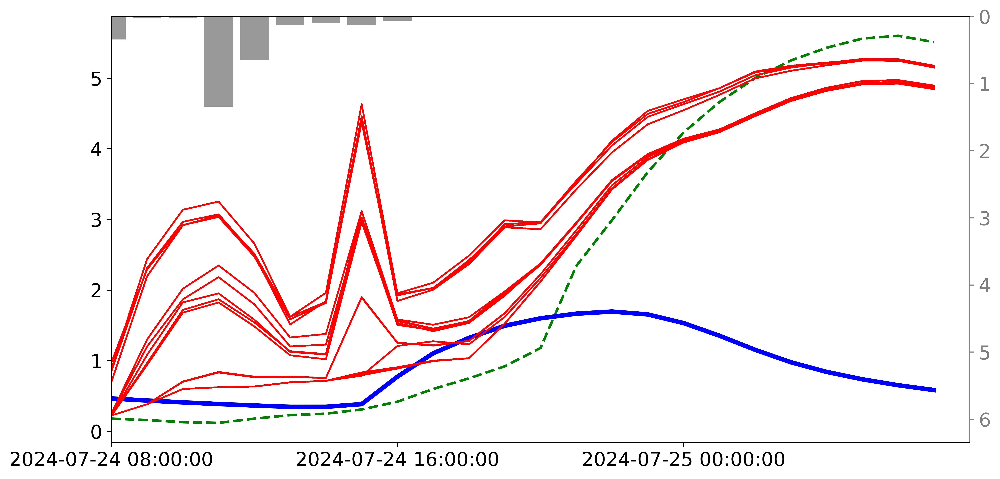

In [77]:
draw_single_station(0,lat_all_flood, lon_all_flood,obs_station_all, da_station_all, sim_station_all,syyyy,tstart,time_len,simmean,pm_name,rainf,lon,lat,pm_path,expname,dahour_str,exp_plotdir)
    

In [78]:
# read 24h data
# make by code /data42/yingying/HydroDA/src/plot/7.make_24forecast.py
# [ens,time_len-24,stations,24hours]
if 'case' in pm_path:
    wlv_da = np.full((pm.ens_mem(),24,8*5,24),np.nan)
    wlv_sim = np.full((pm.ens_mem(),24,8*5,24),np.nan)
    for file_ind in range(1,6):
        filepath = pm.plot_dir()+'/exp_'+expname+dahour_str+'/case'+pm_name[-2]+str(file_ind)
        if 'case1' in pm_name:
            wlv_da[:,:,(file_ind-1)*8:file_ind*8,:] = np.load(filepath+'/rivdph/da_24fore.npy')
            wlv_sim[:,:,(file_ind-1)*8:file_ind*8,:] = np.load(filepath+'/rivdph/sim_24fore.npy')
        else:
            wlv_da[:,:,(file_ind-1)*4:file_ind*4,:] = np.load(filepath+'/rivdph/da_24fore.npy')
            wlv_sim[:,:,(file_ind-1)*4:file_ind*4,:] = np.load(filepath+'/rivdph/sim_24fore.npy')            
else:
    filepath = pm.plot_dir()+'/exp_'+expname+dahour_str+'/ils'
    wlv_da  = np.load(filepath+'/rivdph/da_24fore.npy')
    wlv_sim = np.load(filepath+'/rivdph/sim_24fore.npy')
    dis_da  = np.load(filepath+'/outflw/da_24fore.npy')
    dis_sim = np.load(filepath+'/outflw/sim_24fore.npy')

/data50/yingying/HydroDA/src/plot/jupyter/code/make_plot.py:361: RuntimeWarning: Mean of empty slice
  axes[row,col].set_ylim(0,np.nanmax([np.nanmax(obs_plot),np.nanmax(np.nanmean(wlv_da[:,:,plot_idx,:],axis=0)),np.nanmax(sim_plot[:,-1])])+0.2)
/data50/yingying/HydroDA/src/plot/jupyter/code/make_plot.py:373: RuntimeWarning: Mean of empty slice
  y_value = np.nanmean(wlv_da[:,int(time_ind-tstart_da),i,:],axis=0)
/data50/yingying/HydroDA/src/plot/jupyter/code/make_plot.py:361: RuntimeWarning: Mean of empty slice
  axes[row,col].set_ylim(0,np.nanmax([np.nanmax(obs_plot),np.nanmax(np.nanmean(wlv_da[:,:,plot_idx,:],axis=0)),np.nanmax(sim_plot[:,-1])])+0.2)
/data50/yingying/HydroDA/src/plot/jupyter/code/make_plot.py:373: RuntimeWarning: Mean of empty slice
  y_value = np.nanmean(wlv_da[:,int(time_ind-tstart_da),i,:],axis=0)
/data50/yingying/HydroDA/src/plot/jupyter/code/make_plot.py:361: RuntimeWarning: Mean of empty slice
  axes[row,col].set_ylim(0,np.nanmax([np.nanmax(obs_plot),np.nanmax(n

How many stations improve:  100.00 %


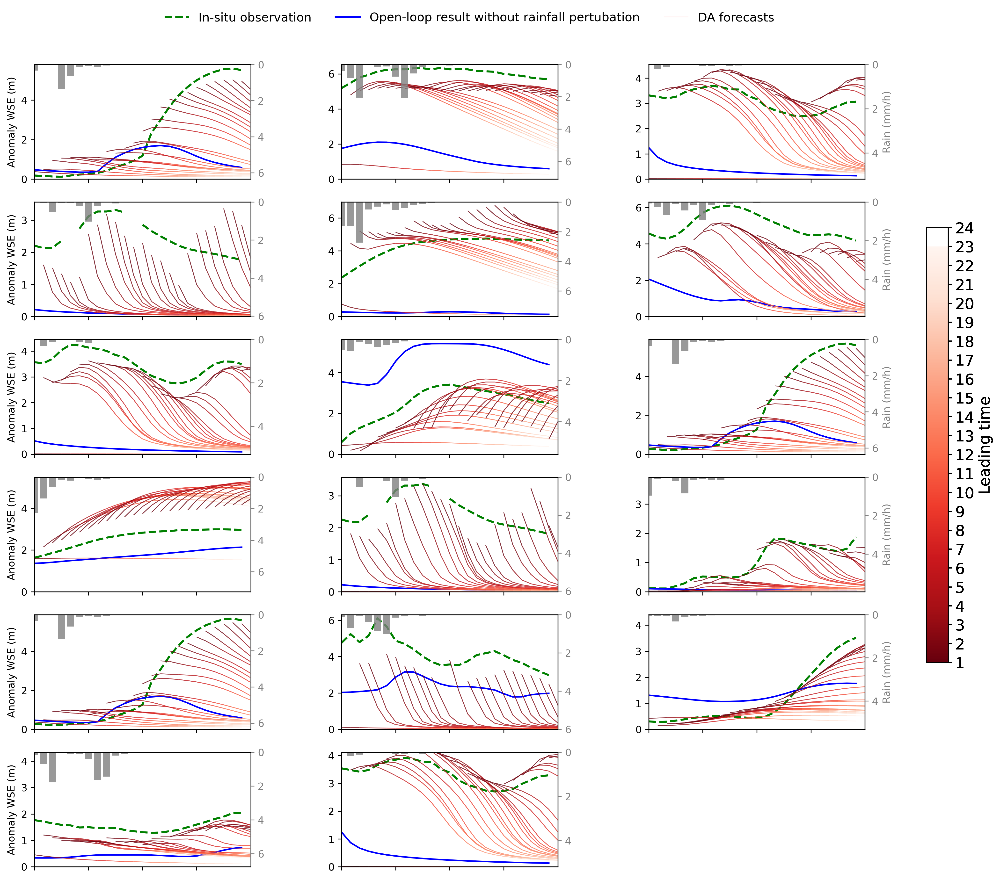

In [79]:
# plot station 24 hour forecast wlv validation
station_lat,station_lon,station_idx,wlv_da_test = mpt.draw_fore_lines('Anomaly WSE (m)',wlv_da,'_wlv',[],[],[],obs_station_all,lat_all_flood,lon_all_flood,simmean,sim_station_all,da_station_all,time_len,rainf,exp_plotdir,tstart,tstart_da,dahour,lat,lon)


In [80]:
# calculate time error across forecast result at 24 hour
# [station,24hour]
time_error_da,time_error_sim  = evaluate_timeerror(wlv_da,dahour,obs_point_ind,sim_point_ind,tstart_fore,obs_station_all,lat_all_flood,lon_all_flood,simmean,sim_station_all,da_station_all,time_len)
print(time_error_sim)

[ -8.  -7.  -7.  -4.  -4.  -9.  -4.  -1.  -8.   3.  -4. -23.  -8.   3.
  -1.  nan  nan]


/data50/yingying/HydroDA/src/plot/jupyter/code/basic_command.py:175: RuntimeWarning: Mean of empty slice
  da_data = np.nanmean(wlv_da[:,:,station_ind,:],axis=0)


In [81]:
#%% evaluate the 24 hours forecast performance which is ahead of peak flow
da_matrix_wlv, sim_matrix_wlv = evaluate_tot_hour(obs_station,sim_station,wlv_da,lat_all_flood,lon_all_flood,obs_station_all,da_station_all,sim_station_all,tstart_fore,simmean,time_len,wlv_sim)

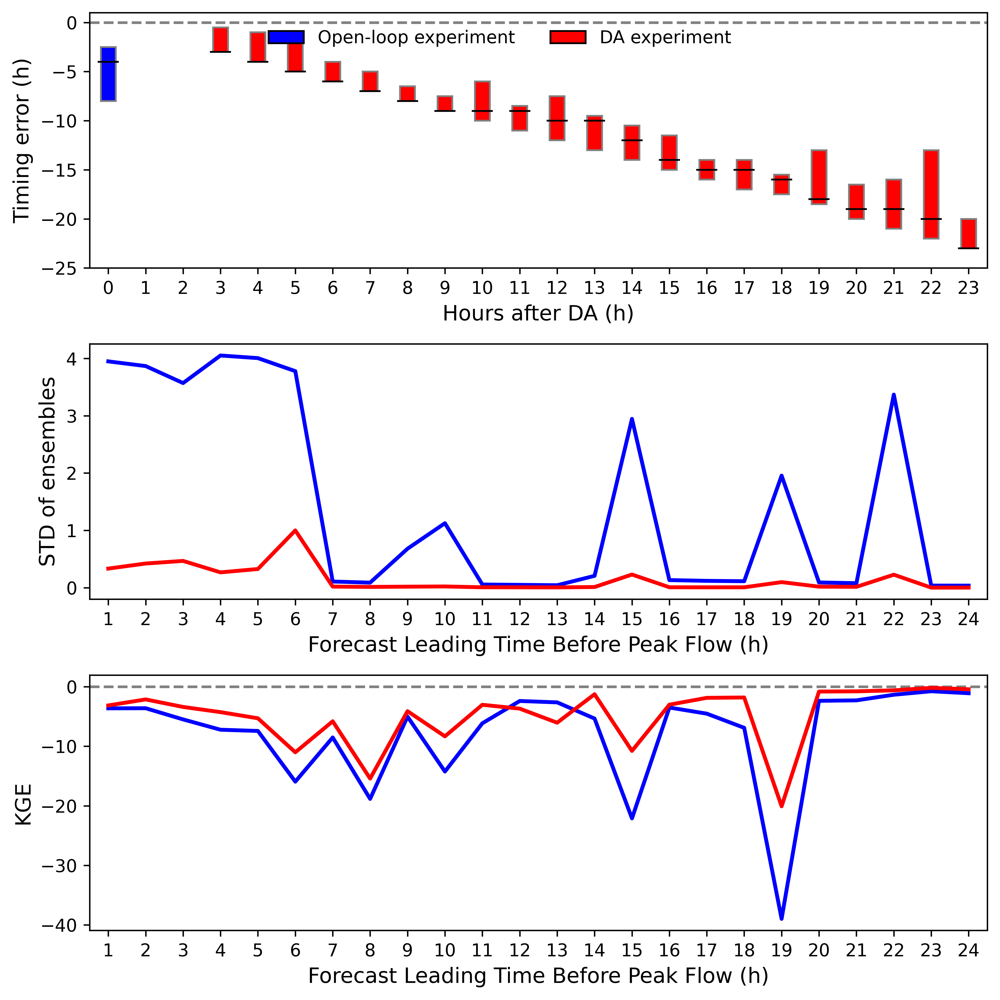

In [82]:
#%% plot lines
# mpt.plot_24lines(sim_matrix_wlv,da_matrix_wlv,'wlv',time_error_sim,time_error_da,exp_plotdir)
mpt.plot_24lines4(sim_matrix_wlv,da_matrix_wlv,'wlv',time_error_sim,time_error_da,exp_plotdir)


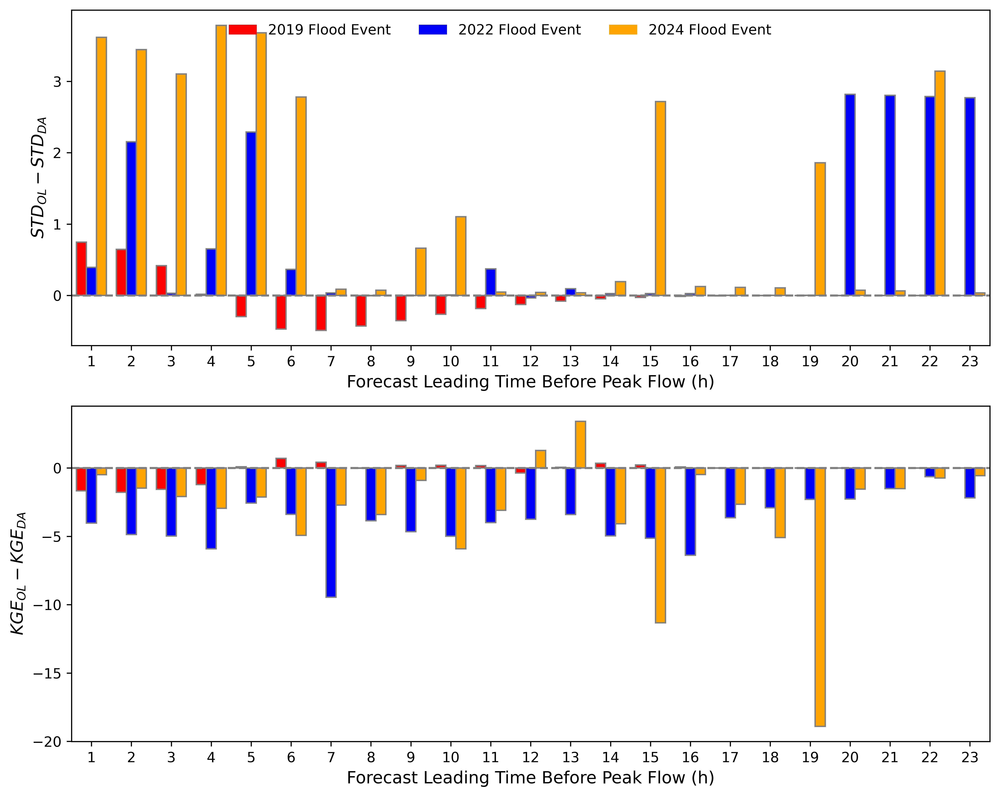

In [83]:
# three events
def plot_3event_diff(varname):
    sim1 = np.load('sim_fore2019.npy')
    da1  = np.load('da_fore2019.npy')
    sim2 = np.load('sim_fore2022.npy')
    da2  = np.load('da_fore2022.npy')
    sim3 = np.load('sim_fore2024.npy')
    da3  = np.load('da_fore2024.npy')
    fig, axs = plt.subplots(2, 1, figsize=(10, 8),dpi=600)
    mpt.plot_eventbar(axs[0],sim1[:,5],sim2[:,5],sim3[:,5],da1[:,5],da2[:,5],da3[:,5],r"$STD_{OL}-STD_{DA}$") # standard daviation
    mpt.plot_eventbar(axs[1],sim1[:,2],sim2[:,2],sim3[:,2],da1[:,2],da2[:,2],da3[:,2],r"$KGE_{OL}-KGE_{DA}$")
    legend_elements = [Patch(facecolor='red', label='2019 Flood Event'),
                       Patch(facecolor='blue', label='2022 Flood Event'),
                       Patch(facecolor='orange', label='2024 Flood Event')]
    fig.legend(
        handles=legend_elements,
        loc='upper center',
        ncol=3,
        bbox_to_anchor=(0.5, 0.98),
        frameon=False)
    plt.tight_layout()
    plt.savefig(exp_plotdir+'5.24hour_3event_'+varname+'.jpg', format='jpg',dpi=600)
    plt.show()
plot_3event_diff('wlv')


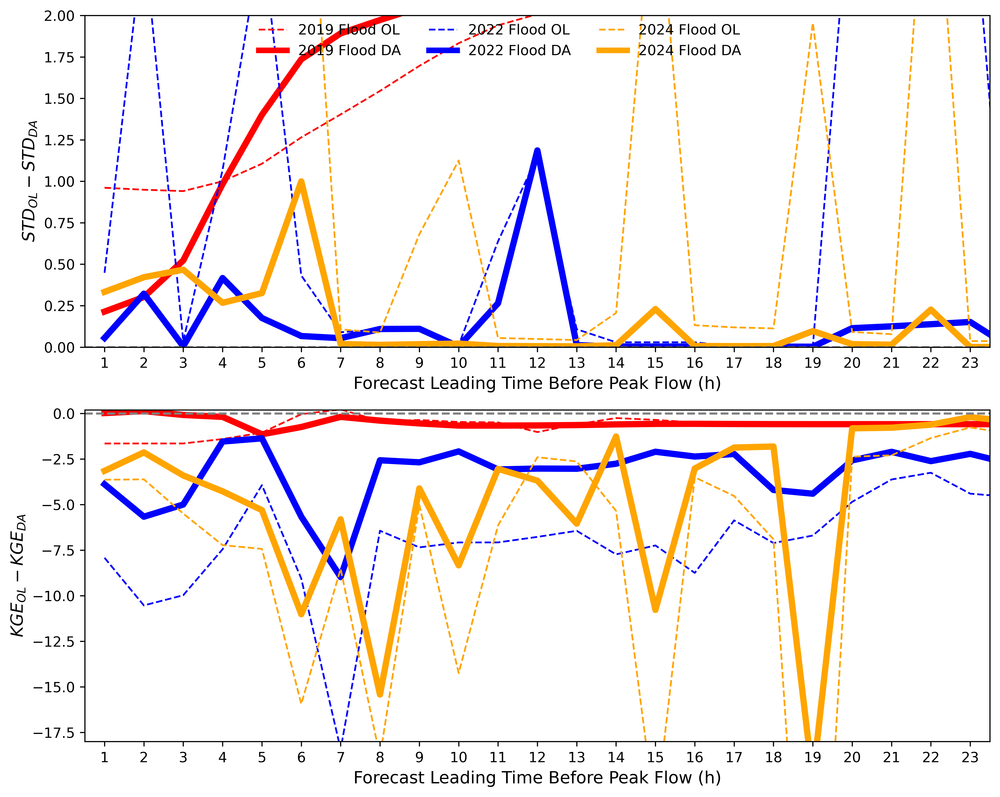

In [93]:
# three events
def plot_3event(varname):
    sim1 = np.load('sim_fore2019.npy')
    da1  = np.load('da_fore2019.npy')
    sim2 = np.load('sim_fore2022.npy')
    da2  = np.load('da_fore2022.npy')
    sim3 = np.load('sim_fore2024.npy')
    da3  = np.load('da_fore2024.npy')
    fig, axs = plt.subplots(2, 1, figsize=(10, 8),dpi=600)
    mpt.plot_eventline(axs[0],sim1[:,5],sim2[:,5],sim3[:,5],da1[:,5],da2[:,5],da3[:,5],2,r"$STD_{OL}-STD_{DA}$") # standard daviation
    mpt.plot_eventline(axs[1],sim1[:,2],sim2[:,2],sim3[:,2],da1[:,2],da2[:,2],da3[:,2],18,r"$KGE_{OL}-KGE_{DA}$")
    legend_elements = [
    Line2D([0], [1], color='red',  lw=1.25, linestyle='--', label='2019 Flood OL'),
    Line2D([0], [1], color='red',  lw=4,    linestyle='-',  label='2019 Flood DA'),
    Line2D([0], [1], color='blue', lw=1.25, linestyle='--', label='2022 Flood OL'),
    Line2D([0], [1], color='blue', lw=4,    linestyle='-',  label='2022 Flood DA'),
    Line2D([0], [1], color='orange', lw=1.25, linestyle='--', label='2024 Flood OL'),
    Line2D([0], [1], color='orange', lw=4, linestyle='-', label='2024 Flood DA')
]
    fig.legend(
        handles=legend_elements,
        loc='upper center',
        ncol=3,
        bbox_to_anchor=(0.5, 0.98),
        frameon=False)
    plt.tight_layout()
    plt.savefig(exp_plotdir+'5.24hour_3line_'+varname+'.jpg', format='jpg',dpi=600)
    plt.show()
plot_3event('wlv')


In [85]:
#%% NRMSE
obs_select_wlv = obs_select(latx_select-1,lony_select-1,data_obs_wlv)
if syyyy == '2019' and 'ils' in pm_path:
    obs_select_dis = obs_select(latx_select-1,lony_select-1,data_obs_dis)

# compare with rivdph
situ_rmse_wlv,lat_plot_wlv,lon_plot_wlv = mpt.draw_each_figure(latx_select-1,lony_select-1,assim_select,id_info,'rivdph',pm_path,inputdir,expname,dahour_str,pm_name,time_len,lon_select,lat_select,flood_time_select,data_obs_wlv,lon,lat,elvmean,simmean,fld_lonmin,fld_lonmax,fld_latmin,fld_latmax)

if 'case' in pm_path:
    if 'all' in pm_path:
        np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lon_case_assim'+pm_name[-4]+'.npy',lon_plot_wlv)
        np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lat_case_assim'+pm_name[-4]+'.npy',lat_plot_wlv)
    else:
        np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lon_case_assim'+pm_name[-5]+pm_name[-4]+'.npy',lon_plot_wlv)
        np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lat_case_assim'+pm_name[-5]+pm_name[-4]+'.npy',lat_plot_wlv)        
elif 'round' in pm_path:
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lon_assim_round'+pm_path[-4]+'.npy',lon_plot_wlv)
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lat_assim_round'+pm_path[-4]+'.npy',lat_plot_wlv)
elif 'ens' in pm_path:
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lon_ens_ind.npy',lon_plot_wlv)
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lat_ens_ind.npy',lat_plot_wlv)  
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/situ_rmse_ens.npy',situ_rmse_wlv)
elif 'patch' in pm_path:
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lon_patch_ind'+pm_name[-1]+'.npy',lon_plot_wlv)
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lat_patch_ind'+pm_name[-1]+'.npy',lat_plot_wlv)  
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/situ_rmse_patch'+pm_name[-1]+'.npy',situ_rmse_wlv)
else:
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lon_assim_ind.npy',lon_plot_wlv)
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/lat_assim_ind.npy',lat_plot_wlv)
    np.save(pm.plot_dir()+'/exp_'+expname+dahour_str+'/situ_rmse_assim.npy',situ_rmse_wlv)

# rivdph
performance(situ_rmse_wlv)

ValueError: cannot reshape array of size 203616 into shape (24,1414)

In [ ]:
# draw comparison between different experiments
# standard setting
rmse_ils     = np.load(pm.plot_dir()+'/exp_ils'+dahour_str+'/situ_rmse_assim.npy')  # patch04
rmse_ens     = np.load(pm.plot_dir()+'/exp_ens'+dahour_str+'/situ_rmse_ens.npy')
rmse_patch04 = np.load(pm.plot_dir()+'/exp_ils'+dahour_str+'/situ_rmse_patch4.npy')
rmse_patch05 = np.load(pm.plot_dir()+'/exp_ils'+dahour_str+'/situ_rmse_patch5.npy')
rmse_patch06 = np.load(pm.plot_dir()+'/exp_ils'+dahour_str+'/situ_rmse_patch6.npy')
rmse_patch07 = np.load(pm.plot_dir()+'/exp_ils'+dahour_str+'/situ_rmse_patch7.npy')
rmse_patch08 = np.load(pm.plot_dir()+'/exp_ils'+dahour_str+'/situ_rmse_patch8.npy')
rmse_patch09 = np.load(pm.plot_dir()+'/exp_ils'+dahour_str+'/situ_rmse_patch9.npy')

# red: better; blue: worse, than standard setting
mpt.draw_rmse(r'$\Delta$RMSE (Perb VS MEPS)','rivdph_rmse',lon_plot_wlv,lat_plot_wlv,rmse_ens-rmse_ils,-1,1,lon,lat,exp_plotdir) 
# mpt.draw_rmse(r'$\Delta$RMSE (Patch04 VS Patch03)','rivdph_rmse',lon_plot_wlv,lat_plot_wlv,rmse_patch04-rmse_ils,-1,1,lon,lat,exp_plotdir) 
# mpt.draw_rmse(r'$\Delta$RMSE (Patch04 VS Patch05)','rivdph_rmse',lon_plot_wlv,lat_plot_wlv,rmse_patch05-rmse_ils,-1,1,lon,lat,exp_plotdir) 
mpt.draw_rmse(r'$\Delta$RMSE (Patch04 VS Patch06)','rivdph_rmse',lon_plot_wlv,lat_plot_wlv,rmse_patch06-rmse_ils,-1,1,lon,lat,exp_plotdir) 
# mpt.draw_rmse(r'$\Delta$RMSE (Patch04 VS Patch07)','rivdph_rmse',lon_plot_wlv,lat_plot_wlv,rmse_patch07-rmse_ils,-1,1,lon,lat,exp_plotdir) 
# mpt.draw_rmse(r'$\Delta$RMSE (Patch04 VS Patch08)','rivdph_rmse',lon_plot_wlv,lat_plot_wlv,rmse_patch08-rmse_ils,-1,1,lon,lat,exp_plotdir) 
# mpt.draw_rmse(r'$\Delta$RMSE (Patch04 VS Patch09)','rivdph_rmse',lon_plot_wlv,lat_plot_wlv,rmse_patch09-rmse_ils,-1,1,lon,lat,exp_plotdir) 



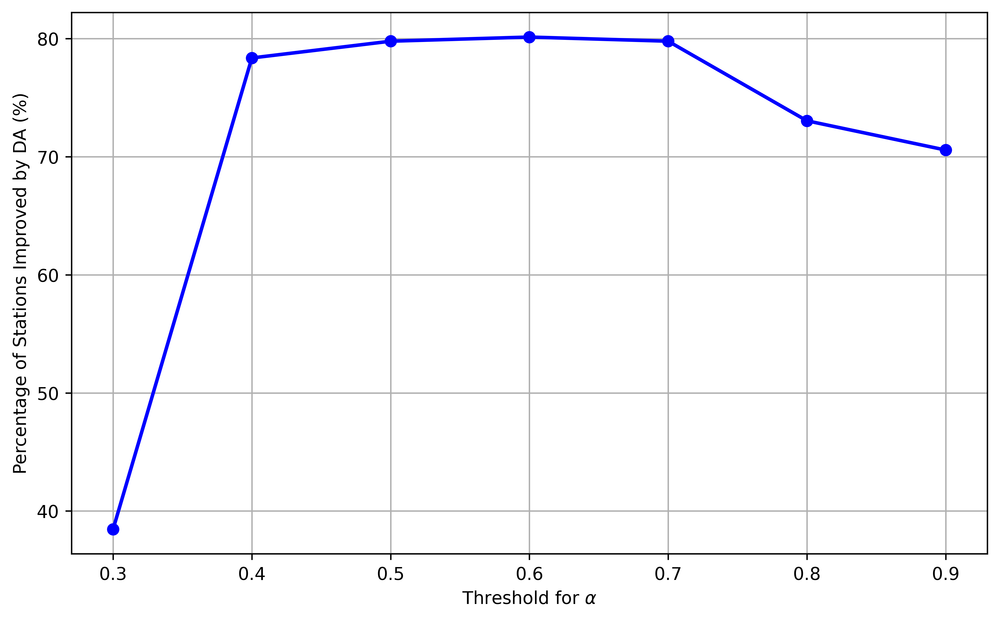

In [25]:
x = [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
y = [38.46, 78.37, 79.79, 80.14, 79.79, 73.05, 70.57]

plt.figure(dpi=600,figsize=(8, 5))
plt.plot(x, y, marker='o', linestyle='-', color='blue', linewidth=2)

plt.xlabel('Threshold for $\\alpha$')
plt.ylabel('Percentage of Stations Improved by DA (%)')
plt.grid(True)
plt.tight_layout()
plt.savefig(exp_plotdir+'9.patch.jpg', format='jpg',dpi=600)
plt.show()